<a href="https://colab.research.google.com/github/stevebak4/Data-mining/blob/main/Corrected_hw1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Τεχνικές Εξόρυξης Δεδομένων**
#**Εργασία 1**
Στέφανος Μπακλαβάς 1115201700093

Γιώργος Γαλάνης 1115201800024


**Import libraries,link to google drive and reading csv data from their respective files**
  
  Στην μεταβλητή titles αποθηκεύουμε τα δεδομένα του netflix_titles.csv, titles2 τα δεδομένα του IMDb movies.csv και στο titles3 τα δεδομένα του IMDb ratings.csv

In [ ]:
# Χρησιμοποιώντας την εντολή import, εισάγετε τις προαναφερθείσες βιβλιοθήκες
# Αν δεν είναι εγκατεστημένες μπορείτε να χρησιμοποιήσετε την εντολή: !pip install <module1> <module2> ...
# για να την εγκαταστήσετε.
# Συνίσταται να ορίσετε local names (pd για το pandas, plt για το matplotlib.pyplot)

from google.colab import drive
drive.mount("/content/drive")



!pip install beautifulsoup4
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import pandas as pd
import numpy as np
from datetime import datetime

from bs4 import BeautifulSoup


# Συμβουλευτείτε την ενότητα Quick Start:
# https://www.crummy.com/software/BeautifulSoup/bs3/documentation.html#Quick%20Start
# για τον τροπο εισαγωγής της BeatifulSoup που θα λειτουργεί σε εσάς.
titles_path = r'/content/drive/MyDrive/Colab Notebooks/data_mining_hw1/netflix_titles.csv'
titles = pd.read_csv(titles_path)
titles_path1 = r'/content/drive/MyDrive/Colab Notebooks/data_mining_hw1/IMDb movies.csv'
titles_path2 = r'/content/drive/MyDrive/Colab Notebooks/data_mining_hw1/IMDb ratings.csv'
titles2 = pd.read_csv(titles_path1)
titles3 = pd.read_csv(titles_path2)


# Χρησιμοπoείται για inline plotting
%matplotlib inline

Mounted at /content/drive


/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# **Ερώτημα 1**
Στο παρακάτω ερώτημα φαίνεται ξεκάθαρα ότι οι ταινίες υπερτερούν έναντι των σειρών

**Περιγραφή κώδικα:**
  Ομαδοποιούνται οι γραμμές με βάση την τιμή της στήλης type και μετριέται το πλήθος ανά κατηγορία περιεχομένου (ταινίες - σειρές) και παρουσιάζονται στο παρακάτω γράφημα

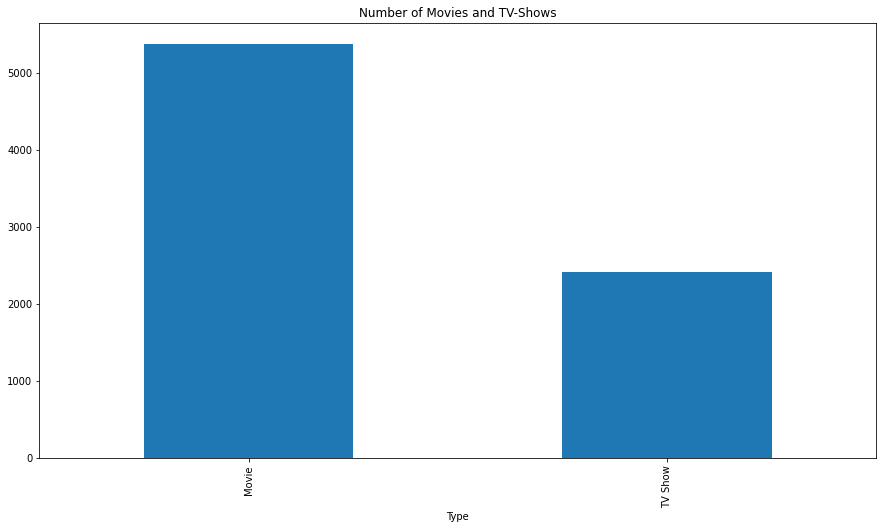

In [ ]:
#read the netflix titles dataset


types = titles.groupby('type')
sums = types.count()
sums['show_id'].plot.bar(title="Number of Movies and TV-Shows",xlabel="Type",figsize=(15,8))
print(" ")

# **Ερώτημα 2**
Παρακάτω παρουσιάζονται οι ταινίες και οι σειρές που έχουν μπει στην πλατφόρμα του Netflix ανά χρονιά.Φαίνεται λοιπόν πως το Netflix επενδύει περισσότερο σε ταινίες,με το ποσοστό των σειρών όμως να αυξάνεται σταδιακά.Θα μπορούσαμε να κοιτάξουμε τα budget κάθε παραγωγής στο αρχείο IMDB movies.csv και να απαντήσουμε την ερώτηση με οικονομικά κριτήρια, όμως τα στοιχεία είναι αρκετά ελλειπή αφού δεν υπάρχουν οικονομικά δεδομένα για πάνω από τις μισές παραγωγές. Έτσι αρκεστήκαμε σε μία ποσοτική μελέτη ταινιών και σειρών για τα τελευταία χρόνια.  

**Περιγραφή κώδικα:**
  Αρχικά διαγράφονται οι γραμμές που δεν έχουν ημερομηνία κυκλοφορίας στο netflix και κρατάμε μόνο τους χρόνους από αυτές τις ημερομηνίες ως ακέραιους. Έπειτα ομαδοποιύνται τα δεδομένα με βάση τον χρόνο κυκλοφορίας και την κατηγορία περιεχομένου στην οποία ανήκουν και τυπώνονται στο γράφημα το πλήθος τους ανά χρόνο.

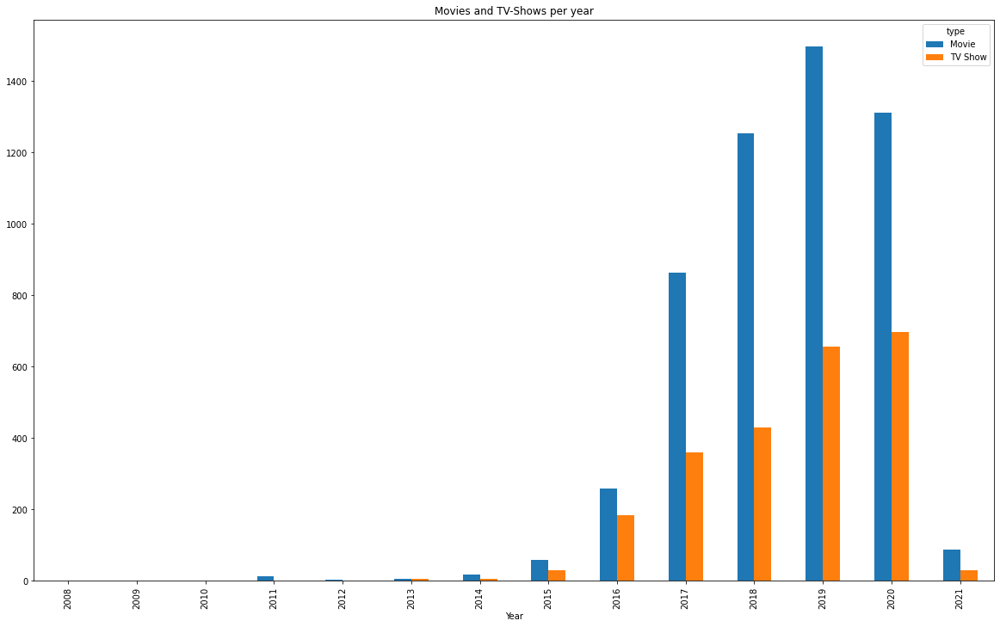

In [ ]:

df = titles
df = df.dropna(subset=['date_added'])
df = df.reset_index(drop=True)
df['date_added'] = pd.to_datetime(df['date_added'])
df['date_added'] = pd.DatetimeIndex(df['date_added']).year
df['date_added'] = df['date_added'].astype(int)


df.groupby(['date_added','type']).size().unstack().plot(kind='bar',stacked=False,figsize=(20,12),title="Movies and TV-Shows per year",xlabel ="Year")
print(" ")




# **Ερώτημα 3**
Φαίνεται ξεκάθαρα ότι η χώρα με το περισσότρερο περιεχόμενο είναι οι Ηνωμένες Πολιτείες.

**Περιγραφή κώδικα:**
  Διαγράφονται οι εγγραφές που δεν έχουν χώρα,ομαδοποιούνται τα δεδομένα με βάση την χώρα και το id για να έχουμε σε κάθε χώρα τα id που υπάρχουν σε αυτή. Στην συνέχεια, επειδή υπάρχουν εγγραφές με πάνω από 1 χώρα , ξεχωρίζουμε αυτές τις χώρες και μετράμε το πλήθος του περιεχομένου που προέρχεται από κάποια συγκεκριμένη χώρα και το αποθηκεύουμε σε ένα dictionary. Έπειτα, φτίαχνουμε δύο λίστες, η μία με τα πλήθη και η άλλη με τις χώρες, αντιστοιχίζουμε τα δεδομένα της μίας με της άλλης, ταξινομόντας τα ταυτόχρονα με βάση το πλήθος, και τέλος τυπώνουμε τα 10 μεγαλύτερα για να είναι καθαρό το γράφημα και όχι στριμογμένο.

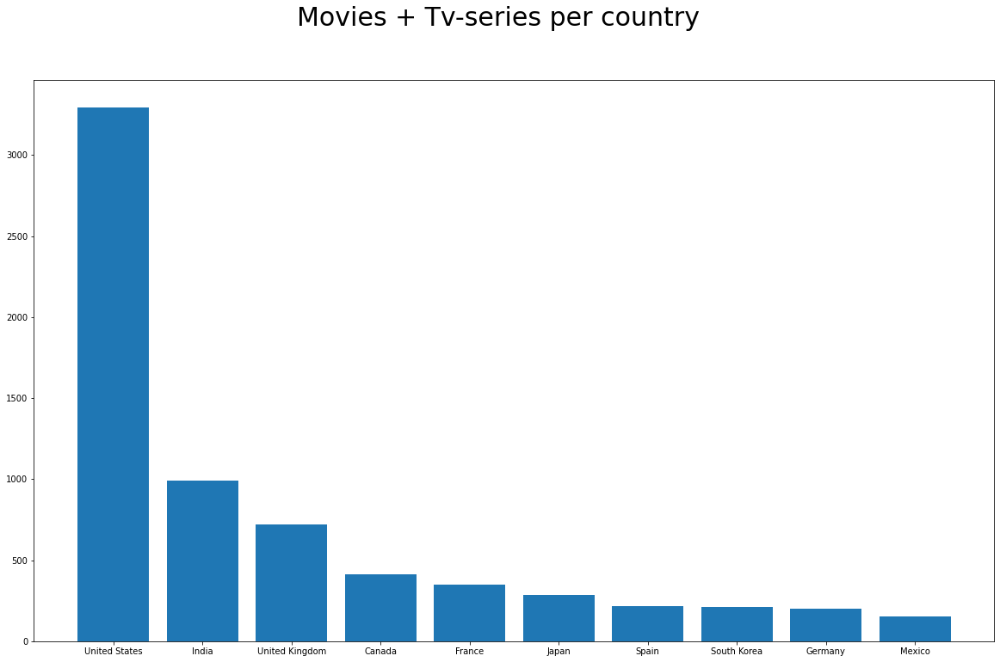

In [ ]:
df = titles

df = df.dropna(subset=['country'])
df = df.reset_index(drop=True)
df = df.groupby(['country' , 'show_id']).size().reset_index(name='count')
rows = df['country']

data = {}
for row in rows:
  row = row.strip()
  " ".join(row.split())
  countries = row.split(", ")
  for country in countries:
    if country in data.keys():
      data[country] = data[country] + 1
    else:
      data[country] = 1


keys = list(data.keys())
values = list(data.values())
wc, wl = zip(*sorted(zip(values,keys),reverse=True))
fig = plt.figure(figsize=(20,12))
values
wl = wl[:10]
wc = wc[:10]
plt.bar(wl,wc)
fig.suptitle("Movies + Tv-series per country", fontsize=30)
print(" ")




# **Ερώτημα 4**
Φαίνεται ξεκάθαρα ότι η χώρα με το περισσότρερο περιεχόμενο είναι οι Ηνωμένες Πολιτείες.

**Περιγραφή κώδικα:**
  Διαγράφονται οι εγγραφές που έχουν κενό είτε στην στήλη της χώρας είτε στην στήλη με τα genre, ομαδοποιούνται τα δεδομένα με βάση την χώρα και τα genre και έπειτα έχοντας φτίαξει ένα country dictionary που περιέχει genre dictionaries σαν περιεχόμενα, μετριέται για κάθε χώρα και για κάθε genre στην χώρα αυτή το πλήθος του περιεχομένου που ανήκει σε αυτές τις ομάδες. Τέλος, τυπώνουμε σε ένα γράφημα για μια συγκεκριμένη χώρα τα 12 μεγαλύτερα σε πλήθος gerne, στο συγκεκριμένο παράδειγμα τις ΗΠΑ.

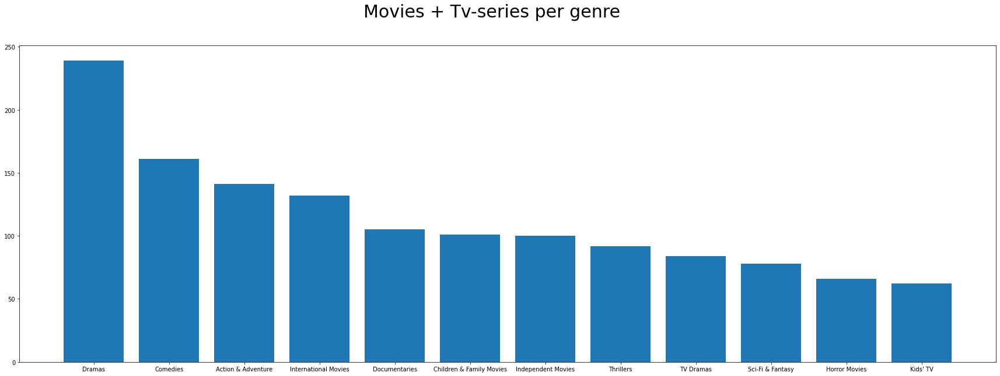

In [ ]:
df = titles

df = df.dropna(subset=['country'])
df = df.dropna(subset=['listed_in'])
df = df.reset_index(drop=True)
df = df.groupby(['country','listed_in']).size().reset_index(name='count')

import collections

countries_dict = collections.defaultdict(dict)
country_row = df['country']
genre_row = df['listed_in']
country_row = list(zip(country_row,genre_row))

for c_row in country_row:
   genres = c_row[1]
   countries = c_row[0]
   countries = countries.strip()
   " ".join(countries.split())
   countries = countries.split(",")
   genres = genres.strip()
   " ".join(genres.split())
   genres = genres.split(", ")
   for country in countries:
      country = country.strip()
      for genre in genres:
        genre = genre.strip()
        if country not in countries_dict.keys():
          countries_dict[country]
        else:
          if genre in countries_dict[country]:
            countries_dict[country][genre] = countries_dict[country][genre] + 1
          else:
            countries_dict[country][genre] = 1




items = list(countries_dict['United States'].items())
countries,sums = zip(*items)
wc, wl = zip(*sorted(zip(sums,countries),reverse=True))
fig = plt.figure(figsize=(30,10))
fig.suptitle("Movies + Tv-series per genre", fontsize=30)
wc= wc[:12]
wl = wl[:12]
plt.bar(wl,wc)
print(" ")



# **Ερώτημα 5**

Παρακάτω παρουσιάζονται οι 15 ηθοποιοί που έχουνε παίξει στις περισσότερες ταινίες και σειρές για την χώρα 'United States'.Αν θέλουμε αποτέλεσμα για άλλη χώρη αρκεί να αλλάξουμε το όνομα στην πρώτη γραμμή του κώδικα.

**Περιγραφή Κώδικα:**
Αρχικά δημιουργοται δύο dataframes που περιέχουν τους ηθοποιούς ανά ταινία και ανά σειρά αντίστοιχα.Επειδή οι περισσότερες παραγωγες έχουν πολλούς ηθοποιούς απαιτείται ο διαχωρισμός τους στις γραμμές ώστε να μπορέσουμε να μετρήσουμε το άθροισμα για κάθε παραγωγή.

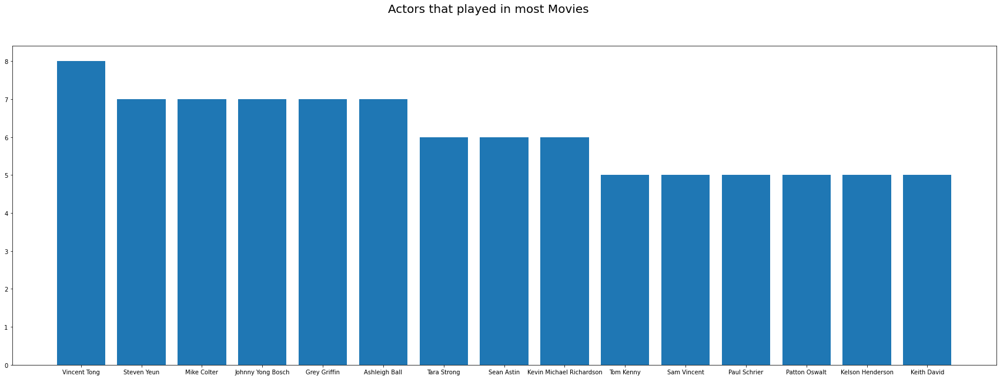

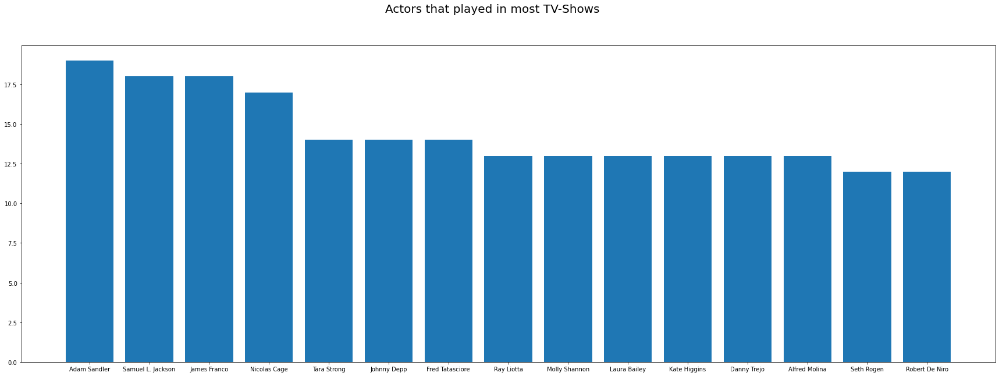

In [ ]:
test_country = 'United States'

df = titles

df = df.dropna(subset=['country'])
df = df.dropna(subset=['cast'])
df = df.reset_index(drop=True)
df = df.groupby(['country','cast','type']).size().reset_index(name='count')

df1 =  df.loc[df['type'] == 'TV Show', ['country', 'cast']]
df2 =  df.loc[df['type'] == 'Movie', ['country', 'cast']]

i=0
for df in df1,df2:
  import collections
  countries_dict = collections.defaultdict(dict)
  country_row = df['country']
  genre_row = df['cast']
  country_row = list(zip(country_row,genre_row))

  for c_row in country_row:
    genres = c_row[1]
    countries = c_row[0]
    countries = countries.strip()
    " ".join(countries.split())
    countries = countries.split(",")
    genres = genres.strip()
    " ".join(genres.split())
    genres = genres.split(", ")
    for country in countries:
        country = country.strip()
        for genre in genres:
          genre = genre.strip()
          if country not in countries_dict.keys():
            countries_dict[country]
          else:
            if genre in countries_dict[country]:
              countries_dict[country][genre] = countries_dict[country][genre] + 1
            else:
              countries_dict[country][genre] = 1




  items = list(countries_dict[test_country].items())
  countries,sums = zip(*items)
  wc, wl = zip(*sorted(zip(sums,countries),reverse=True))
  fig = plt.figure(figsize=(30,10))
  if i == 0:
    fig.suptitle("Actors that played in most Movies", fontsize=20)
  if i == 1:
    fig.suptitle("Actors that played in most TV-Shows", fontsize=20)
  wc= wc[:15]
  wl = wl[:15]
  plt.bar(wl,wc)
  i = i + 1



# **Ερώτημα 6**
Παρακάτω παρουσιάζονται τα διαγράμματα των ταινιών και σειρών ανάλογα με το ηλικιακό κεινό για το οποίο προορίζονται


**Περιγραφή κώδικα**
  Αφού διαγράψουμε πρώτα όποια εγγραφή δεν έχει rating,δημιουργώ δύο dictionary, ένα για ταινίες ένα για σειρές, με κλειδιά τις κατηγορίες στις οποίες κατατάσονται τα ratings, και έπειτα ανάλογα με το αν είναι ταινία ή σειρά, αυξάνω την τιμή της κατηγορίας στην οποία ανήκει στο κατάλληλο dictionary. Έπειτα τυπώνονται τα γραφήματα των πληθών ανά κατηγορία για κάθε είδος περιεχομένου (σειρά-ταινία).

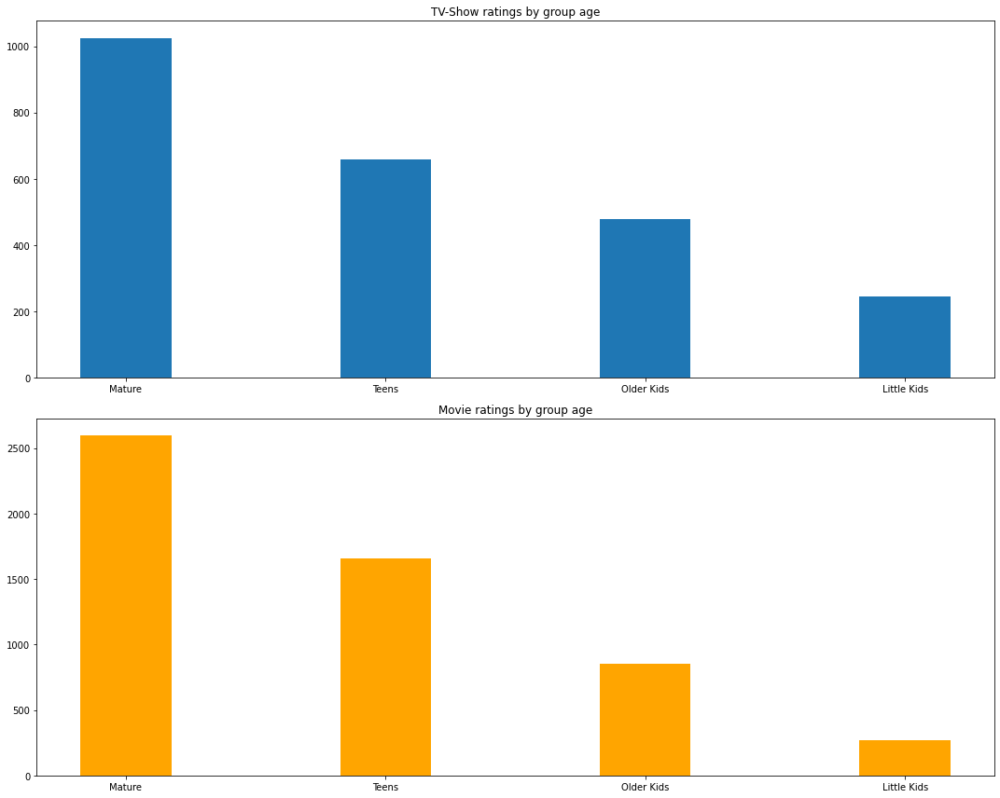

In [ ]:
df = titles
df = df.dropna(subset=['rating'])
df = df.reset_index(drop=True)
df = df.groupby(['rating' , 'type']).size().reset_index(name='count')


series = {
    'Little Kids': 0,
    'Older Kids': 0,
    'Teens': 0,
    'Mature': 0
        }

movies = {
    'Little Kids': 0,
    'Older Kids': 0,
    'Teens': 0,
    'Mature': 0
        }

tuples = [tuple(x) for x in df.to_numpy()]
for row in tuples:
    if row[1]=='Movie':
      if row[0]=='G' or row[0]=='TV-Y' or row[0]=='TV-G':
        movies['Little Kids'] =  movies['Little Kids'] + row[2]
      elif row[0]=='PG' or row[0]=='TV-Y7' or row[0]=='TV-Y7-FV' or row[0]=='TV-PG':
        movies['Older Kids'] = movies['Older Kids'] + row[2]
      elif row[0]=='PG-13' or row[0]=='TV-14':
        movies['Teens'] = movies['Teens'] + row[2]
      elif row[0]=='R' or row[0]=='NC-17' or row[0]=='TV-MA' or row[0]=='NR' or row[0]=='UR':
        movies['Mature'] = movies['Mature'] + row[2]
      else:
        print('Error',row[0])
    elif row[1]=='TV Show':
      if row[0]=='G' or row[0]=='TV-Y' or row[0]=='TV-G':
        series['Little Kids'] =  series['Little Kids'] + row[2]
      elif row[0]=='PG' or row[0]=='TV-Y7' or row[0]=='TV-Y7-FV' or row[0]=='TV-PG':
        series['Older Kids'] = series['Older Kids'] + row[2]
      elif row[0]=='PG-13' or row[0]=='TV-14':
        series['Teens'] = series['Teens'] + row[2]
      elif row[0]=='R' or row[0]=='NC-17' or row[0]=='TV-MA' or row[0]=='NR' or row[0]=='UR':
        series['Mature'] = series['Mature'] + row[2]
      else:
        print('Error',row[0])
    else:
      print('Error')

mkeys = list(movies.keys())
mvalues = list(movies.values())
mwc, mwl = zip(*sorted(zip(mvalues,mkeys),reverse=True))

skeys = list(series.keys())
svalues = list(series.values())
swc, swl = zip(*sorted(zip(svalues,skeys),reverse=True))

fig, ax = plt.subplots(2,1,figsize=(15,12))
width = 0.35
x = np.arange(len(mwl))
ax[0].bar(x , swc, width)
ax[1].bar(x , mwc, width,color='orange')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax[0].set_title('TV-Show ratings by group age')
ax[0].set_xticks(x)
ax[0].set_xticklabels(swl)


ax[1].set_title('Movie ratings by group age')
ax[1].set_xticks(x)
ax[1].set_xticklabels(mwl)



fig.tight_layout()
plt.show()

# **Ερώτημα 7**
Παρακάτω παρουσιάζεται το διάγραμμα του πλήθους των ταινιών,των σειρών ,αλλά και το άθροισμά τους ανά μήνα.

**Περιγραφή κώδικα:** Aρχικά διαγράδουμε τις γραμμές που δεν έχουνε date_added και από κάθε ημερομηνία κρατάμε μόνο τον μήνα.Στην συνέχεια φτιάχνυνε δύο λίστες μία με τους μήνες των ταινιών και μία με τους μήνες των σειρών και μετράμε πόσες φορές εμφανίζεται ο κάθε μήνας σε κάθε λίστα. Τέλος παρουσιάζονται τα διαγράμματα


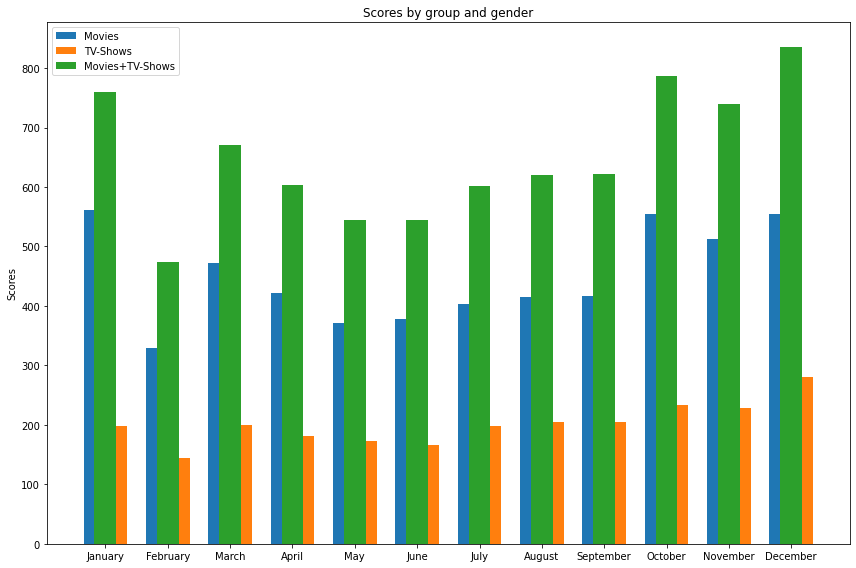

In [ ]:
df = titles

df = df.dropna(subset=['date_added'])
df = df.reset_index(drop=True)
df['date_added'] = pd.to_datetime(df['date_added'])
df['date_added'] = pd.DatetimeIndex(df['date_added']).month
df['date_added'] = df['date_added'].astype(int)

sums = df.count()

labels = ['January', 'February', 'March', 'April','May','June', 'July', 'August', 'September','October','November','December']
movies_counts = list(df.loc[df['type']== "Movie",'date_added'])
shows_counts =  list(df.loc[df["type"]== "TV Show",'date_added'])

#print(movies_counts)
l1 =  [1 for i in range(12)]

l2 =  [1 for i in range(12)]
for x in range(12):
  for y in movies_counts:
    if (x + 1) == y:
      l1[x] += +1

for x in range(12):
  for y in shows_counts:
    if (x + 1) == y:
      l2[x] += 1

movies_counts = l1
shows_counts = l2
all_counts =  list([x + y for x, y in zip(movies_counts, shows_counts)])

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars



fig, ax = plt.subplots(figsize=(12,8))
ax.bar(x - width/2, movies_counts, width, label='Movies')
ax.bar(x + width/2,shows_counts, width, label='TV-Shows')
ax.bar(x ,all_counts, width, label='Movies+TV-Shows')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Scores by group and gender')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()


fig.tight_layout()

plt.show()


# **Ερώτηση 8**
Παρακάτω παρουσιάζονται τα 5 είδη με το περισσότερο περιεχόμανο.

**Περιγραφή κώδικα:** Αρχικά διαγράφουμε τις γραμμές που έχουν στην στήλη 'listed_in' κενή.Στην συνέχεια σπάμε τις γραμμες που η ταινία ή η σειρά ανήκει σε περισσότερα από ένα είδη. Τέλος μετράμε πόσες φορές εμφανίζεται το κάθε είδος και παρουσιάουμε τα 5 επικρατέστερα είδη.

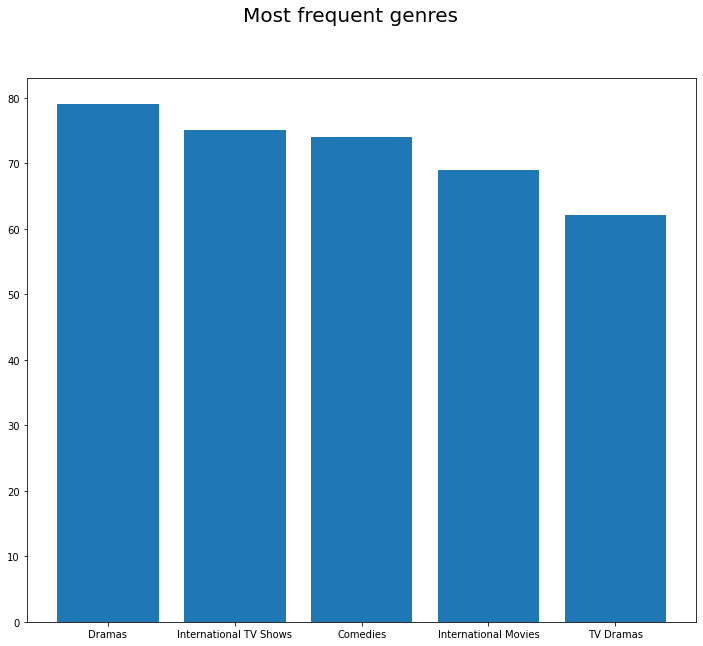

In [ ]:
df = titles

df = df.dropna(subset=['listed_in'])
df = df.reset_index(drop=True)
df = df.groupby(['listed_in']).size().reset_index(name='count')



import collections

countries_dict ={}
rows = df['listed_in']
data = {}

for row in rows:
  row = row.strip()
  " ".join(row.split())
  listed = row.split(", ")
  for genre in listed:
    if genre in data.keys():
      data[genre] = data[genre] + 1
    else:
      data[genre] = 1


keys = list(data.keys())
values = list(data.values())
wc, wl = zip(*sorted(zip(values,keys),reverse=True))
fig = plt.figure(figsize=(12,10))
values
wl = wl[:5]
wc = wc[:5]
plt.bar(wl,wc)
fig.suptitle("Most frequent genres", fontsize=20)
print(" ")

# **Ερώτηση 9**
Παρακάτω παρουσιάζονται οι 12 σκήνοθέτες από το 'United Kingdom' που έχουν σκηνοθετήσει τις περισσότερες ταινίες.Αν θέλουμε αποτελέσματα για διαφορετική χώρα αρκεί να αλλάξουμε την 1η γραμμή του κώδικα.

**Περιγραφή κώδικα:**
Αρχικά διαγράφονται οι γραμμέςπου δεν έχουν σκηνοθέτη ή χώρα.Στην συνέχεια ομαδοπουούμε τις χώρες με τους σκηνοθέτες. Κάποιες γραμμές μπορεί να έχουν πάνω έναν σκηνοθέτη ή χώρα οπότε μετράμε για κάθε χώρα που υπάρχει στην συγκεκριμένη γραμμή πόσοι σκηνοθέτες αντιστοιχούν σε αυτή την χώρα.Τελος παρουσιάζονται οι 12 δημοφιλέστεροι σκηνοθέτες για το 'United Kingdom'.

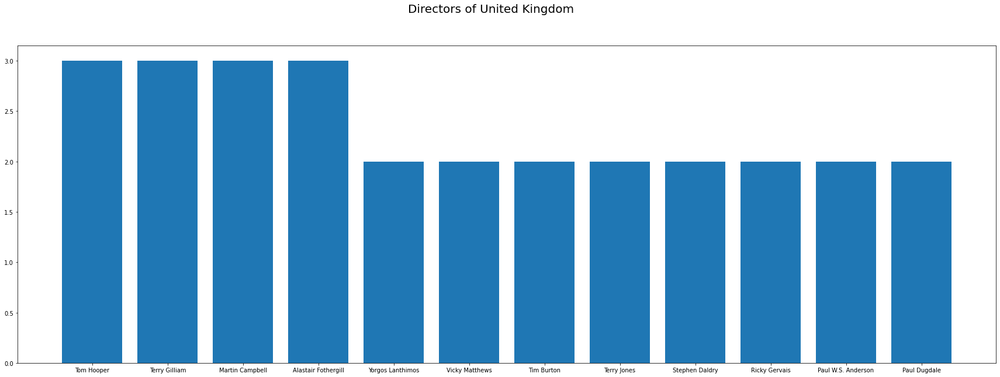

In [ ]:
current_country = 'United Kingdom' #change this line to search for another country

df = titles

df = df.dropna(subset=['country'])
df = df.dropna(subset=['director'])
df = df.reset_index(drop=True)
df = df.groupby(['country','director']).size().reset_index(name='count')

import collections

countries_dict = collections.defaultdict(dict)
country_row = df['country']
director_row = df['director']
country_row = list(zip(country_row,director_row))

for c_row in country_row:
   directors = c_row[1]
   countries = c_row[0]
   countries = countries.strip()
   " ".join(countries.split())
   countries = countries.split(",")
   directors = directors.strip()
   " ".join(directors.split())
   directors = directors.split(", ")
   for country in countries:
      country = country.strip()
      for director in directors:
        director = director.strip()
        if country not in countries_dict.keys():
          countries_dict[country]
        else:
          if director in countries_dict[country]:
            countries_dict[country][director] = countries_dict[country][director] + 1
          else:
            countries_dict[country][director] = 1

items = list(countries_dict[current_country].items())
countries,sums = zip(*items)
wc, wl = zip(*sorted(zip(sums,countries),reverse=True))
fig = plt.figure(figsize=(30,10))
plt.title = ("Directors")
wc= wc[:12]
wl = wl[:12]
plt.bar(wl,wc)
fig.suptitle("Directors of %s" % current_country, fontsize=20)
print(" ")

# **Ερώτηση 10**
Παρακάτω παρουσιάζονται αθροιστικά το από πόσες σεζόν αποτελείται μία σειρά του Netflix

**Περιγραφή κώδικα:**
  Διαγράφονται τα κενά από τα πλαίσια που μας ενδιαφέρουν, κρατάμε από τις εγγραφές που αφορούν σειρές, το είδος και το duration και ομαδοποιούμαι με βάση το duration. Έπειτα μετράμε στοιχεία ανά duration και τυπώνουμε sorted τα πλήθη.

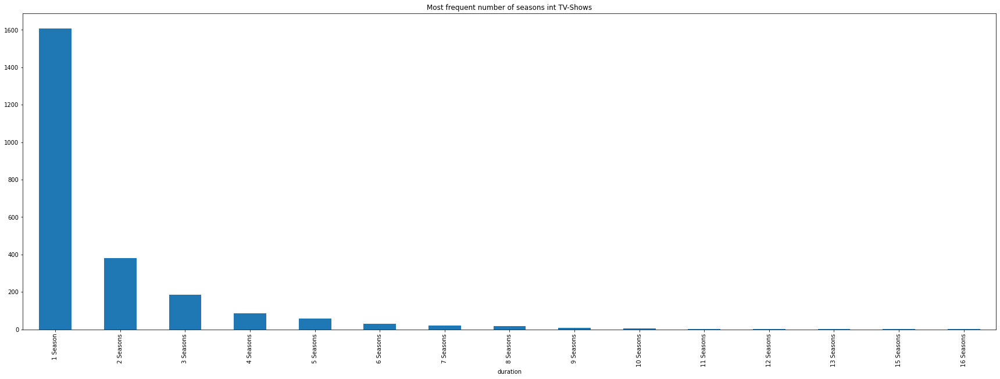

In [ ]:
df = titles
df = df.dropna(subset=['type'])
df = df.reset_index(drop=True)
df = df.dropna(subset=['duration'])
df = df.reset_index(drop=True)
df = df.loc[df["type"] == 'TV Show',["type","duration"]]
df = df.groupby('duration')

sums = df.count()
sums = sums.sort_values(by='type', ascending=False)
sums['type'].plot(kind='bar',figsize=(30,10),title ="Most frequent number of seasons int TV-Shows")

print(" ")

# **Ερώτηση 11**

Παρακάτω παρουσιάζονται 10 ταινίες με την υψηλότερη βαθμολογία στο Netflix

**Περγιγραφή κώδικα:**Αρχικά διαγράφονται οι γραμμές με κενά στο πεδίο 'title' και 'weighted_average_vote'. Στη συνέχεια κάνουμε inner join με βάση τον τίτλο στα αρχεία netflix_titles.csv και IMDb movies.csv για να ενώσουμε τελικά αυτό που προκύπτει με το IMDb ratings.csv .Έπειτα τα ταξινομούμε με βάση τη βαθμολογία τους και από το τελικό dataframe παιρνουμε τις 10 καλύτερες ταινίες με βάση το weightet_average_vote.


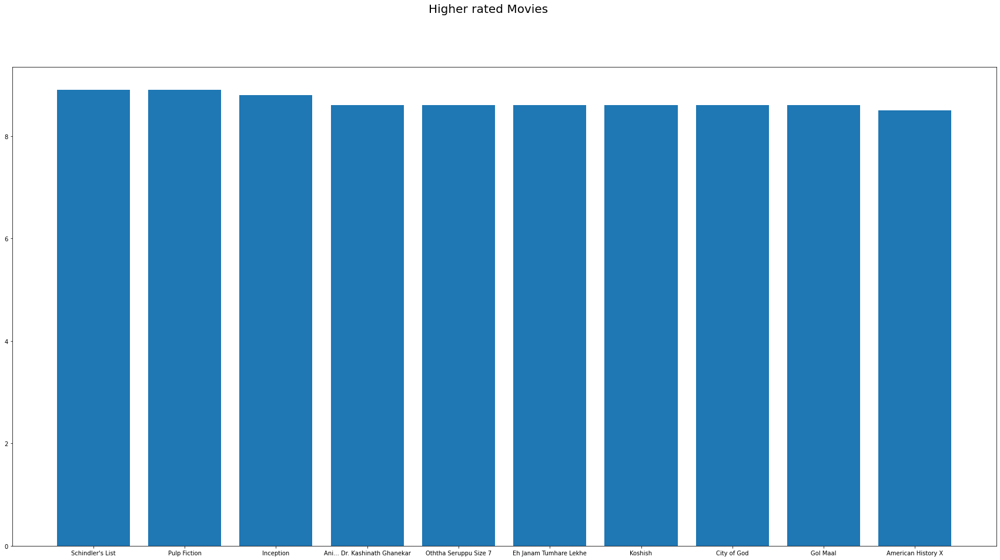

In [ ]:

df1 = titles
df2 = titles2
df3 = titles3

df2 = df2.dropna(subset=['title'])
df2 = df2.reset_index(drop=True)

df3 = df3.dropna(subset=['weighted_average_vote'])
df3 = df3.reset_index(drop=True)


df = pd.merge(df1, df2,how ='inner',on=['title'])
df = df.dropna(subset=['title'])
df = df.reset_index(drop=True)
df = df.drop_duplicates(subset=["show_id"])

df = pd.merge(df, df3,how ='inner',on=['imdb_title_id'])

df = df.sort_values(
     by="weighted_average_vote",ascending=False )
df = df.loc[df["type"] == 'Movie',['title',"weighted_average_vote"]]

df5 = df[:10]
title = list(df5['title'])
vote = list(df5['weighted_average_vote'])
fig = plt.figure(figsize=(30,15))
plt.bar(title,vote)
fig.suptitle("Higher rated Movies" ,fontsize=20)
print(" ")

# **Θέμα 2 Ερώτηση 1**

Παρακάτω παρουσιάζεται το dataframe που φτίαχνεται απ το bool boW των μονογραμμάτων και διγραμμάτων.

**Περιγραφή κώδικα:**
Αρχικά διαγράφονται οι γραμμές που δεν έχουν τίτλο ή περιγραφή.Στην συνέχεια φτιάχνεται το διάνυσμα των μονογραμμάτων και διγραμμάτων για τις 1000 λέξεις που εμφανίζονται συχνότερα, ενώ αφαιρούνται από αυτές οι stop_words των αγγλικών.Στην συνέχεια παίρνουμε το bool boW σε έναν πίνακα και τα ονόματα των λέξεων σε έναν άλλο ενώ φτιάχνεται και το dataframe του boW.


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
df = titles
df = df.dropna(subset=['title'])
df = df.dropna(subset=['description'])

df = df.reset_index(drop=True)

titl = df['title']
bow_vectorizer = CountVectorizer(ngram_range=(1,2),max_df=1.0, min_df=1 ,dtype=bool,max_features=10000,stop_words='english')
bow = bow_vectorizer.fit_transform(df['description'])
bow_arr = bow.toarray()
bow_names = bow_vectorizer.get_feature_names()
df5 = pd.DataFrame(bow_arr, columns=bow_vectorizer.get_feature_names(),index=df['title'])
df5
bow_df = df5
bow_df

,000,000 euros,000 prize,000 years,007,10,10 000,10 year,10 years,100,100 000,10th,11,11 year,12,12 year,12 years,13,13 year,13 years,14,14 year,14th,14th century,15,15 year,15 years,16,16 year,16 years,16th,16th century,17,17 year,17th,17th century,18,18 year,18th,18th century,...,young girl,young journalist,young love,young lovers,young man,young men,young mother,young musicians,young newlywed,young orphan,young police,young soccer,young son,young university,young woman,young women,younger,younger brother,younger sister,younger woman,youngest,youngsters,youth,youths,youtube,youtube sensation,yu,yuletide,yuppie,zac,zach,zack,zany,zealand,zero,zoe,zombie,zombie apocalypse,zombies,zone
title,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3%,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
7:19,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
23:59,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
21,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zozo,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False

# **Θέμα 2 Ερώτηση 1.b**

Παρακάτω παρουσιάζεται το dataframe των μονογραμμάτων και διγραμμάτων για 10000 στοιχεία αν αφαιρέσουμε τις english stop words.

**Περιγραφή κώδικα:**
  Χρησιμοποιείται ο κώδικας που έχει παραθέσει για την δημιουργία του tf-idf πίνακα, απλά έχουμε περάσει και την παράμετρο ngram_range=(1, 2) η οποία καθορίζει ότι θα φτιάξουμε και unigrams και digrams στον συγκεκριμένο πίνακα,
και τις υπόλοιπες παραμέτρους για να περιορίσουμε κάπως το μέγεθος για γρηγορότερη προσπέλαση και πράξεις πάνω στον πίνακα.

In [ ]:
df = titles
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 2),max_df=1.0, min_df=1, max_features=10000,stop_words='english')

unibigrams = tfidf_vectorizer.fit_transform(df['description'])




# **Θέμα 2 Ερώτηση 2.α**
Παρακάτω παρουσιάζεται το dataframe που προκύπτει αν για όλες τις ταινίες βρούμε το jaccard coefficient.

**Περιγραφή κώδικα:** Παίρνουμε τους δύο πίνακες και για κάθε ταινία υπολογίζονται το jaccard coefficient που έχει με όλες τις ταινίες. (Ταινίες και Σειρές)

In [ ]:
from sklearn.metrics.pairwise import pairwise_distances
from scipy.spatial.distance import cdist
df = df5
movies1 = df.values
movies2 = df.values

jac_sim = 1- pairwise_distances(movies1,movies2, metric='jaccard')
df6 = pd.DataFrame(jac_sim, columns=df.index,index=df.index)
df6

title,3%,7:19,23:59,9,21,46,122,187,706,1920,1922,1983,1994,"2,215",3022,Oct-01,Feb-09,22-Jul,15-Aug,'89,​​Kuch Bheege Alfaaz,​Goli Soda 2,​Maj Rati ​​Keteki,​Mayurakshi,​SAINT SEIYA: Knights of the Zodiac,(T)ERROR,(Un)Well,#Alive,#AnneFrank - Parallel Stories,#blackAF,#cats_the_mewvie,#FriendButMarried,#FriendButMarried 2,#realityhigh,#Roxy,#Rucker50,#Selfie,#Selfie 69,แผนร้ายนายเจ้าเล่ห์,"¡Ay, mi madre!",...,اشتباك,الف مبروك,Yu-Gi-Oh!,Yu-Gi-Oh! Arc-V,Yucatán,Yummy Mummies,Yunus Emre,Yuva,Z Nation,Z4,Zach Galifianakis: Live at the Purple Onion,Zack and Miri Make a Porno,Zak Storm,Zaki Chan,Zapped,Zed Plus,Zenda,Zero,Zero Hour,Zig & Sharko,Zindagi Gulzar Hai,Zindagi Kitni Haseen Hay,Zindagi Na Milegi Dobara,Zinzana,Zion,Zipi & Zape y la Isla del Capitan,Zoé: Panoramas,Zodiac,Zoids Wild,Zokkomon,Zombie Dumb,Zombieland,Zona Rosa,Zoo,Zoom,Zozo,Zubaan,Zulu Man in Japan,Zumbo's Just Desserts,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS
title,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3%,1.000000,0.0000,0.038462,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.043478,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.038462,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.000000,0.052632,0.0,0.0,0.0,0.0,0.000000,0.043478,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.040000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7:19,0.000000,1.0000,0.000000,0.000000,0.000000,0.0,0.000000,0.023810,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.028571,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.032258,0.0,0.030303,0.033333,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.029412,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.035714,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.03125,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.032258,0.000000,0.033333,0.000000,0.000000,0.062500,0.0,0.000000
23:59,0.038462,0.0000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.034483,0.0,0.0,0.00000,0.000000,0.041667,0.0,0.0,0.0,0.0,0.000000,0.035714,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
9,0.000000,0.0000,0.000000,1.000000,0.041667,0.0,0.000000,0.000000,0.0,0.0,0.0,0.037037,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.037037,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.043478,0.000000,0.000000,0.000000,0.000000,0.038462,0.000000,0.0,0.000000
21,0.000000,0.0000,0.000000,0.041667,1.000000,0.0,0.000000,0.027778,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.043478,0.0,0.000000,0.000000,0.0,0.0,0.0,0.035714,0.038462,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zozo,0.000000,0.0000,0.000000,0.000000,0.00000

# **Τop 100 jaccard coefficient**

Παρακάτω φτιάχνεται ένα dictionary όπου για κάθε ταινία κρατάμε τις 100 πιο όμοιες σύμφωνα με το jaccard coefficient.

In [ ]:
df = df6
movies = df.values

column_names = list(df.columns)
row_names = list(df.index)

import collections
import operator

dictionary = {}
top100 = {}
mnames = []
for i in range(len(column_names)):
  mnames.append(column_names[i])
for j in range(len(row_names)):
  top100[mnames[j]] = []
  l = [(item,idx) for idx,item in enumerate(movies[j])]
  for x in range(101):
    index, value = max(enumerate(l), key=operator.itemgetter(1))
    del l[index]
    if value[0] == float(0.0):
      break
    if value[1] != j:
      top100[mnames[j]].append((mnames[value[1]],value[0]))




# **Εκτύπωση του παραπάνω top100 dictionary**

In [ ]:
for i in range(len(mnames)):
  print(mnames[i],':',top100[mnames[i]])

3% : [('High Society', 0.09523809523809523), ('The Stranded', 0.09090909090909094), ('My Schoolmate, the Barbarian', 0.09090909090909094), ('Stoked', 0.08695652173913049), ('Penguins of Madagascar: The Movie', 0.08333333333333337), ('Mossad 101', 0.08333333333333337), ('Kill Command', 0.08333333333333337), ('How to Train Your Dragon 2', 0.08333333333333337), ('Teresa', 0.07692307692307687), ('Futmalls.com', 0.05882352941176472), ('Equilibrium', 0.05882352941176472), ('The One I Love', 0.05555555555555558), ('Morya', 0.05555555555555558), ('Inside The Freemasons', 0.05555555555555558), ('Zig & Sharko', 0.052631578947368474), ("World's Weirdest Homes", 0.052631578947368474), ('Word Party', 0.052631578947368474), ('Uyare', 0.052631578947368474), ('The Boulet Brothers Dragula', 0.052631578947368474), ('Pyaar Ka Punchnama 2', 0.052631578947368474), ('Million Pound Menu', 0.052631578947368474), ('Anon', 0.052631578947368474), ('What Happened to Monday', 0.050000000000000044), ('The Night Com

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Bala Loca : [('The Case for Christ', 0.13043478260869568), ('Hidden Worlds', 0.125), ('The Reservoir Game', 0.12), ('Inside the World’s Toughest Prisons', 0.09523809523809523), ('Voyeur', 0.08695652173913049), ('The Men Who Stare at Goats', 0.08695652173913049), ('Mr. Deeds', 0.08695652173913049), ('Ma Chu Ka', 0.08695652173913049), ('Black Friday', 0.07999999999999996), ('Bad Boy Billionaires: India', 0.07999999999999996), ('Elaan', 0.07692307692307687), ('Dirty Money', 0.07407407407407407), ('Argon', 0.07407407407407407), ('Blood Pact', 0.0714285714285714), ('Answer for Heaven', 0.0714285714285714), ('Tiger King: Murder, Mayhem and Madness', 0.06896551724137934), ('The Last Thing He Wanted', 0.06896551724137934), ('The Lamb', 0.06896551724137934), ('Kai Po Che!', 0.06896551724137934), ('28 Days', 0.06896551724137934), ('To and From New York', 0.06451612903225812), ('Money Talks', 0.06451612903225812), ('Good Sam', 0.0625), ('Zodiac', 0.06060606060606055), ('The Polka King', 0.060606

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[('Hugo', 0.11538461538461542), ('Manto', 0.09523809523809523), ('Valeria', 0.09090909090909094), ('The Warning', 0.09090909090909094), ('The Incredible Story of the Giant Pear', 0.09090909090909094), ('El sendero de la anaconda', 0.09090909090909094), ('Search Party', 0.08695652173913049), ('Her', 0.08695652173913049), ('Charité', 0.08695652173913049), ('Pocoyo Halloween: Spooky Movies', 0.08333333333333337), ('Romance is a bonus book', 0.07999999999999996), ('In The Dark', 0.07999999999999996), ('Franca: Chaos and Creation', 0.07999999999999996), ('A Patch of Fog', 0.07999999999999996), ('X: Past Is Present', 0.07692307692307687), ('Tunnel', 0.07692307692307687), ('Come and Find Me', 0.07692307692307687), ('Burning', 0.07692307692307687), ('She-Ra and the Princesses of Power', 0.07407407407407407), ('Satria Heroes: Revenge of the Darkness', 0.07407407407407407), ("Kings of Jo'Burg", 0.07407407407407407), ('Earthquake Bird', 0.07407407407407407), ('The Writer', 0.0714285714285714), ('

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: [('Fire in the Blood', 0.1428571428571429), ('My Daddy is in Heaven', 0.13043478260869568), ('Under the Eiffel Tower', 0.11111111111111116), ('Sardaarji 2', 0.1071428571428571), ('Mahi NRI', 0.1071428571428571), ('Hard Kill', 0.1071428571428571), ('The Accidental Spy', 0.09999999999999998), ('Step Outside', 0.09999999999999998), ('My Horrible Grandma', 0.09090909090909094), ('In Paradox', 0.08695652173913049), ('Superfly', 0.08333333333333337), ('Special', 0.08333333333333337), ('Spanish Affair 2', 0.08333333333333337), ('Santo Cachón', 0.08333333333333337), ('Hantu Kak Limah', 0.08333333333333337), ('An Egyptian Story', 0.08333333333333337), ('Adam: His Song Continues', 0.08333333333333337), ("You're Everything To Me", 0.07999999999999996), ('White Nights', 0.07999999999999996), ('The Last Man on the Moon', 0.07999999999999996), ('The Blazing Sun', 0.07999999999999996), ('Lembi 8 Giga', 0.07999999999999996), ("Hamza's Suitcase", 0.07999999999999996), ('Fractured', 0.0799999999999999

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 : [('Anarkali of Aarah', 0.11538461538461542), ('The Salvation', 0.11111111111111116), ('Gatao 2: Rise of the King', 0.11111111111111116), ('Anjaan', 0.10344827586206895), ('Ajji', 0.09999999999999998), ('Kabali (Hindi Version)', 0.09677419354838712), ('High & Low The Movie', 0.09677419354838712), ('The Assignment', 0.09090909090909094), ('Lilli', 0.08695652173913049), ('The Queen and the Conqueror', 0.07999999999999996), ('Edge of Fear', 0.07999999999999996), ('The Car: Road to Revenge', 0.07692307692307687), ('La Doña', 0.07692307692307687), ('Beiimaan Love', 0.07692307692307687), ('When Angels Sleep', 0.07407407407407407), ('On the Wrong Track', 0.07407407407407407), ('O Silêncio do Céu', 0.07407407407407407), ('Amrapali', 0.07407407407407407), ('Suzzanna: Buried Alive', 0.0714285714285714), ('My True Friend', 0.0714285714285714), ('Lady J', 0.0714285714285714), ('Immortals', 0.0714285714285714), ('The Rover', 0.06896551724137934), ('The Paramedic', 0.06896551724137934), ('Revenge'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Saawan : [('I Am Michael', 0.19999999999999996), ('Gabriel and the Mountain', 0.19999999999999996), ('22-Jul', 0.19999999999999996), ('Lost Girls', 0.19354838709677424), ('Extremely Wicked, Shockingly Evil and Vile', 0.19354838709677424), ('Loving', 0.1875), ('The Intouchables', 0.18518518518518523), ('The Sky Is Pink', 0.1785714285714286), ('Walk. Ride. Rodeo.', 0.1724137931034483), ('The Command', 0.1724137931034483), ('Self Made: Inspired by the Life of Madam C.J. Walker', 0.16666666666666663), ('When They See Us', 0.16129032258064513), ('The Search', 0.16129032258064513), ('93 Days', 0.16129032258064513), ('Wish Man', 0.1578947368421053), ('The Mirror Boy', 0.15625), ('Adrift', 0.15625), ('The Boy Who Harnessed the Wind', 0.1515151515151515), ('Ride Like a Girl', 0.1515151515151515), ('Notes for My Son', 0.1515151515151515), ('Historia de un clan', 0.1515151515151515), ('Zodiac', 0.1470588235294118), ('The Polka King', 0.1470588235294118), ('Raya and Sakina', 0.1470588235294118), 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 : [('Joan Didion: The Center Will Not Hold', 0.18181818181818177), ('2,215', 0.1428571428571429), ('Clarence Clemons: Who Do I Think I Am?', 0.13636363636363635), ('Becoming', 0.13636363636363635), ('El Pepe, a Supreme Life', 0.13043478260869568), ('Anitta: Made In Honório', 0.125), ('Born in Syria', 0.12), ('The Pixar Story', 0.09523809523809523), ('Once In A Lifetime Sessions with Nile Rodgers', 0.09523809523809523), ('Zoé: Panoramas', 0.09090909090909094), ('Tyson', 0.09090909090909094), ('Hasta los dientes', 0.09090909090909094), ('Paris Is Burning', 0.08695652173913049), ("Jeremy Scott: The People's Designer", 0.08695652173913049), ('Iverson', 0.08695652173913049), ('Have You Seen the Listers?', 0.08695652173913049), ('Clive Davis: The Soundtrack of Our Lives', 0.08695652173913049), ('Alejandro Sanz: What I Was Is What I Am', 0.08695652173913049), ('Late Life: The Chien-Ming Wang Story', 0.08333333333333337), ("Hello, Privilege. It's Me, Chelsea", 0.08333333333333337), ('Dolly Pa


# **Θέμα 2 Ερώτηση 2.b**


**Περιγραφή κώδικα:**
  Χρησιμοποιούμε την συνάρτηση pairwise_distances η οποία με παράμετρο metric='cosine' υπολογίζει για κάθε γραμμή του matrix unibigrams την cosine distance της με κάθε άλλη γραμμή του πίνακα. Έτσι καταλήγουμε σε έναν πίνακα με τιμές την απόσταση της ταινίας σε μία γραμμή i με μια ταινία στην στήλη j. Προφανώς οι τιμές του πίνακα βρίσκονται στο δίαστημα [0,1].

In [ ]:
from sklearn.metrics import pairwise_distances
df = df5
movie_sims = 1 - pairwise_distances(unibigrams.toarray(),metric='cosine')
df7 = pd.DataFrame(movie_sims, columns=df.index,index=df.index)
df7



title,3%,7:19,23:59,9,21,46,122,187,706,1920,1922,1983,1994,"2,215",3022,Oct-01,Feb-09,22-Jul,15-Aug,'89,​​Kuch Bheege Alfaaz,​Goli Soda 2,​Maj Rati ​​Keteki,​Mayurakshi,​SAINT SEIYA: Knights of the Zodiac,(T)ERROR,(Un)Well,#Alive,#AnneFrank - Parallel Stories,#blackAF,#cats_the_mewvie,#FriendButMarried,#FriendButMarried 2,#realityhigh,#Roxy,#Rucker50,#Selfie,#Selfie 69,แผนร้ายนายเจ้าเล่ห์,"¡Ay, mi madre!",...,اشتباك,الف مبروك,Yu-Gi-Oh!,Yu-Gi-Oh! Arc-V,Yucatán,Yummy Mummies,Yunus Emre,Yuva,Z Nation,Z4,Zach Galifianakis: Live at the Purple Onion,Zack and Miri Make a Porno,Zak Storm,Zaki Chan,Zapped,Zed Plus,Zenda,Zero,Zero Hour,Zig & Sharko,Zindagi Gulzar Hai,Zindagi Kitni Haseen Hay,Zindagi Na Milegi Dobara,Zinzana,Zion,Zipi & Zape y la Isla del Capitan,Zoé: Panoramas,Zodiac,Zoids Wild,Zokkomon,Zombie Dumb,Zombieland,Zona Rosa,Zoo,Zoom,Zozo,Zubaan,Zulu Man in Japan,Zumbo's Just Desserts,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS
title,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3%,1.000000,0.000000,0.056081,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.052685,0.0,0.0,0.000000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.046006,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.076529,0.0,0.0,0.0,0.0,0.000000,0.064476,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.103685,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7:19,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.021680,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.055916,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.015969,0.0,0.028026,0.063202,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.025339,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.048070,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.014757,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.053773,0.000000,0.014112,0.000000,0.000000,0.078594,0.0,0.000000
23:59,0.056081,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.058844,0.0,0.0,0.000000,0.000000,0.064124,0.0,0.0,0.0,0.0,0.000000,0.054025,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.034403,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
9,0.000000,0.000000,0.000000,1.000000,0.033285,0.0,0.000000,0.000000,0.0,0.0,0.0,0.020967,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.029280,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.027479,0.000000,0.000000,0.000000,0.000000,0.080889,0.000000,0.0,0.000000
21,0.000000,0.000000,0.000000,0.033285,1.000000,0.0,0.000000,0.035850,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.112701,0.0,0.000000,0.000000,0.0,0.0,0.0,0.027164,0.068299,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zozo,0.000000,0.000000,0.000000,0.00

# **Top 100 similar movies dictionary**

**Περιγραφή πίνακα:**
  Αφού αρχικοποιήσουμε έναν πίνακα με τα ονόματα των ταινιών με index σε αντιστοιχία με το index της ταινίας στο csv αρχείο, για κάθε ταινία βρίσκουμε τις 100 πιο όμοιες της, χρησιμοποιώντας μια λίστα από tuples που περιέχουν την τιμή της απόστασης της τρέχουσας ταινίας με μία άλλη που βρίσκεται σε κάποια στήλη του πίνακα που υπολογίσαμε στο 2.β ,και το index στον πίνακα αυτό, ένα loop που τρέχει 101 φορές, παίρνω κάθε φορά το μικρότερο στοιχείο της λίστας, το διαγράφω από αυτή και το τοποθετώ στο dictionary. 101 επαναλήψεις κάνουμε γιατί η μία (η πρώτη που επιστρέφει η συνάρτηση min) είναι η ίδια ταίνια με αυτή που ψάχνουμε. Ο συγκεκριμένος κώδικας τρέχει αρκετή ώρα περίπου 15-20 λεπτά) δεδομένου των πολλών δεδομενων και πράξεων (7787 φορές ψάχνουμε σε 7787 στοιχεία τα 100 μικρότερα)

In [ ]:
import operator
df = df6
movies = df.values

top100simb = {}
top100simt = {}
df = titles
mnames = []
for i in range(len(movie_sims)):
  mnames.append(df.loc[i,'title'])
for i in range(len(movie_sims)):
  top100simt[mnames[i]] = []
  lt = [(item,idx) for idx,item in enumerate(movie_sims[i])]
  for j in range(101):
    tindex, tvalue = max(enumerate(lt), key=operator.itemgetter(1))
    del lt[tindex]
    if value[0] == float(0.0):
      break
    if tvalue[1]!=i:
      top100simt[mnames[i]].append((mnames[tvalue[1]],tvalue[0]))










# **Εκτύπωση του παραπάνω top100sim dictionary**

In [ ]:
for i in range(len(mnames)):
  print(mnames[i],':',top100simt[mnames[i]])

3% : [('Stoked', 0.15547055210562255), ('The Stranded', 0.1465872594970662), ('Teresa', 0.1441274719203841), ('The Keeping Hours', 0.1398884597511989), ('Tu Hai Mera Sunday', 0.13526459856552253), ('High Society', 0.13491164758800822), ('Room on the Broom', 0.13062773537775396), ('Lifechanger', 0.130017977028131), ('My Schoolmate, the Barbarian', 0.12830336961168465), ('Gangs of New York', 0.11384007521815342), ('Hank: Five Years from the Brink', 0.11242219377120233), ('Kill Command', 0.11153470739418625), ('Penguins of Madagascar: The Movie', 0.11035241675551122), ('Fire in Paradise', 0.10872397945909762), ('Mossad 101', 0.10823881600697405), ('Couple of Days', 0.10768952666940534), ('Mosul', 0.10671230028407885), ('Jail', 0.10637690805243549), ('Budhia Singh: Born to Run', 0.10520123328432529), ('Zoo', 0.10368513957152958), ('How to Train Your Dragon 2', 0.10314393851504922), ('Vincent N Roxxy', 0.10279596163005678), ('Terminator 3: Rise of the Machines', 0.1021009426224373), ('Ken J

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 : [("The Butterfly's Dream", 0.15709206825995037), ('Earthquake Bird', 0.1536756553074221), ('The Bomb Squad', 0.15132264194442335), ('Vanjagar Ulagam', 0.1495112394656749), ('Alexandria ... Why?', 0.14547309788593887), ('Ghost Whispers', 0.14314332861741186), ('Tokyo Trial', 0.141423176713649), ('The Story of Us with Morgan Freeman', 0.14077091969764832), ('Race to Witch Mountain', 0.13894262820147396), ('Power Rangers Lightspeed Rescue', 0.136871245691498), ('The NSU-Complex', 0.13432649773559346), ('Elles étaient en guerre (1914-1918)', 0.13335675106692368), ('Harry and Snowman', 0.1316118780074873), ('The War: A Film by Ken Burns and Lynn Novick', 0.13120457290070608), ('Rattlesnake', 0.12797405776583815), ('The Road to Calvary', 0.1279638155973587), ('World War II in Colour', 0.12740709852642185), ("The Devil's Mistress", 0.12671815913084417), ('Planetarium', 0.12479474921511047), ('My Honor Was Loyalty', 0.12439732948351012), ('In This Corner of the World', 0.1236139121593629), 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 [('Koshish', 0.4050417206583832), ('Barfi!', 0.29664538311631716), ('Radiopetti', 0.2584334143927042), ('Winchester', 0.18707859864211285), ('Iqbal', 0.1764717849702485), ('Stranger than Fiction', 0.15964820468284913), ('Triple Threat', 0.14670612643678727), ('Trikal (Past, Present, Future)', 0.1314652196499526), ('Malicious', 0.12316713547486025), ('Lilli', 0.1119975621466357), ('Once Upon a Time', 0.11062970602627498), ('Operator', 0.11009939924615231), ('Truth or Dare', 0.10867352831262744), ('Kismat Konnection', 0.10720445878189022), ('Delirium', 0.10634090213050518), ('Merry Men: The Real Yoruba Demons', 0.1053076400699785), ('Bodyguard', 0.10403805433240365), ('Psycho', 0.10354147687481996), ('Sardaar ji', 0.10237486442267785), ('The Spiderwick Chronicles', 0.10175755019368582), ('White Nights', 0.10053070488608762), ('The Brave', 0.0998738457602455), ('Empire of Scents', 0.09967794616348591), ('V for Vendetta', 0.09793038312496194), ('My Fuhrer', 0.09781129232936414), ('Andhadh

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 : [('Power Rangers Samurai', 0.5343478553125303), ('Power Rangers Samurai: Party Monsters (Halloween Special)', 0.4519549212106646), ('Power Rangers Wild Force', 0.4064162721235769), ('Power Rangers Lost Galaxy', 0.40590202784140705), ('Power Rangers in Space', 0.2651780424717769), ('Power Rangers RPM', 0.25851974947056666), ('Power Rangers Dino Thunder', 0.2449027869431537), ('Power Rangers Jungle Fury', 0.24461660766130622), ('Power Rangers Super Samurai: Trickster Treat', 0.2440739745607483), ('Power Rangers Super Samurai: Stuck on Christmas', 0.22794069707931697), ('Power Rangers Mystic Force', 0.22649569224730282), ('Power Rangers Operation Overdrive', 0.22640070838557036), ('Power Rangers Ninja Storm', 0.22350998329857763), ('Mighty Morphin Power Rangers', 0.20479066946034263), ('Power Rangers Zeo', 0.19899580918519422), ('Power Rangers Samurai: Clash of the Red Rangers', 0.19592022445218005), ('Power Rangers S.P.D.', 0.18045634203640826), ('Lupin the 3rd: The Castle of Cagliost

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 : [('Love, Chunibyo & Other Delusions!', 0.4231694450665282), ('Love and Fortune', 0.3690715539239894), ("Sadie's Last Days on Earth", 0.3035289057945525), ('Revisions', 0.2858475023906166), ("River's Edge", 0.27131100086440596), ("A Babysitter's Guide to Monster Hunting", 0.2529288967657435), ('F.R.E.D.I.', 0.24429778801382462), ('AMO', 0.24326460046665244), ('Code Geass: Lelouch of the Rebellion', 0.2419009226807438), ('#realityhigh', 0.24101394744272453), ('Before I Fall', 0.23792356928446345), ('Gnome Alone', 0.2356071756675444), ('Haikyu!!', 0.22229983941385), ('Lady Bird', 0.21543159731051975), ('Fireworks', 0.21372346912760987), ('CLANNAD', 0.20528646861820565), ('Teasing Master Takagi-san', 0.19993873855852295), ('The Perfect Date', 0.19428391972434012), ('Qué pena tu serie', 0.18410033895665356), ('Extracurricular', 0.17476326811510912), ('Sommore: Chandelier Status', 0.16575298344866518), ('Selfless', 0.1597196906798003), ('Transfers', 0.15571503283063715), ('Monster High: W

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 [('100% Halal', 0.20105968409967923), ('All In My Family', 0.1857689268322722), ('Dil Vil Pyaar Vyaar', 0.18525477337764173), ('Sí, Mi Amor', 0.17171087346640224), ('The Awakening of Motti Wolkenbruch', 0.16594998874367517), ('Muramba', 0.15328603011847308), ('The Players', 0.13746649587126525), ('Love Storm', 0.13438238164549243), ('The Rehearsal', 0.13192063869892445), ('Pyaar Ka Punchnama 2', 0.13064332204282714), ('Blue Valentine', 0.12885379536174146), ('At All Costs', 0.12285580563062315), ('The Lovers', 0.12034923278397791), ('The Reconquest', 0.119714503204843), ("Angela's Christmas", 0.11704649567777559), ('I Am Divine', 0.10974974535222315), ('Dedh Ishqiya', 0.10681323690671851), ('NOVA: Prediction by the Numbers', 0.10611794416982623), ('Kyaa Kool Hain Hum 3', 0.10586479830755224), ('Without Gorky', 0.10519006098305717), ('4th Man Out', 0.10437929509797828), ('Sweet Magnolias', 0.10375439780607021), ('Selena: The Series', 0.10307735264785678), ('Virsa', 0.10213555216462189)

# **Θέμα 2 Ερώτημα 3 με χρήση του top100sim dictionary**

**Περιγραφή κώδικα:**
  Σε περίπτωση που επίλεξεται να φτίαξετε το dictionary, μπορείτε να χρησιμοποιήσετε την παρακάτω μέθοδο. Ανάλογα την μέθοδο που επιλέγει ο χρήστης επιστρέφει τις n πρώτες ταινίες από την αντίστοιχη θέση του dictionary.

In [ ]:
def get_similar_movies1(mvtitle,N=10,method='boolean'):
  if method=='tf-idf':
    if mvtitle in top100simt:
      if N in range(len(top100simt[mvtitle])):
        return top100simt[mvtitle][:N]
      else:
        print('N =',N,'is larger than the size of the top100sim[',mvtitle,'] list which is ',len(top100simt[mvtitle]))
        return []
    else:
      print('Movie :\'',mvtitle,'doesn\'t exist in the database')
      return []
  elif method=='boolean':
    if mvtitle in top100:
      if N in range(len(top100[mvtitle])):
        return top100[mvtitle][:N]
      else:
        print('N =',N,'is larger than the size of the top100[',mvtitle,'] list which is ',len(top100[mvtitle]))
        return []
    else:
      print('Movie :\'',mvtitle,'doesn\'t exist in the database')
      return []



[('High Society', 0.09523809523809523), ('The Stranded', 0.09090909090909094), ('My Schoolmate, the Barbarian', 0.09090909090909094), ('Stoked', 0.08695652173913049), ('Penguins of Madagascar: The Movie', 0.08333333333333337), ('Mossad 101', 0.08333333333333337), ('Kill Command', 0.08333333333333337), ('How to Train Your Dragon 2', 0.08333333333333337), ('Teresa', 0.07692307692307687), ('Futmalls.com', 0.05882352941176472)]
Top 10


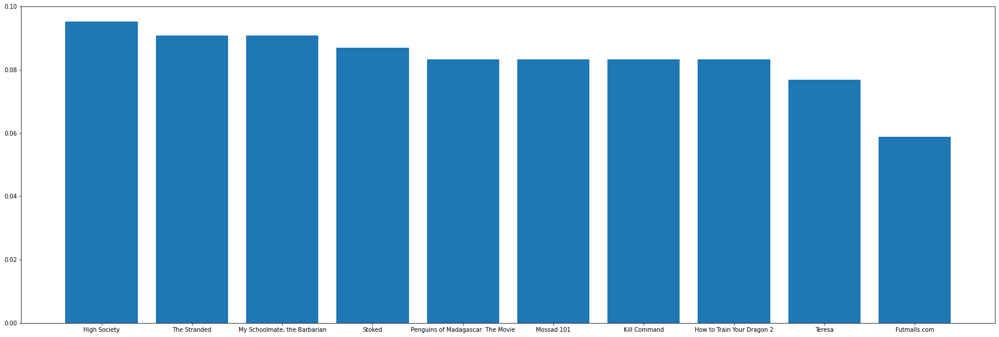

In [ ]:
result = get_similar_movies1('3%',method='boolean')
print(result)
movie,similarity = zip(*result)
wc, wl = zip(*sorted(zip(similarity,movie),reverse=True))
fig = plt.figure(figsize=(30,10))
plt.title = ("Directors")
wc= wc[:10]
wl = wl[:10]
plt.bar(wl,wc)


# **Θέμα 2 Ερώτημα 3 χωρίς την χρήση του top100sim dictionary**

**Περιγραφή κώδικα:**
  Ακολουθούμε την ίδια λογική με την top 100 similar movies, απλώς για μία μόνο ταινία, οπότε είναι πολύ πιο γρήγορο σε περίπτωση που απλά θέλουμε να ψάξουμε προτινόμενες για μερικές ταινίες

In [ ]:
def get_similar_movies12(mvtitle,N=10,method='boolean'):
  top = []
  df = titles
  if N > len(movie_sims):
    print("N is bigger than the number of movies in the dataset")
    return []
  if method=='tf-idf':
    pos = -1
    for i in range(len(movie_sims)):
      if df.loc[i,'title']==mvtitle:
        pos = i
        break
    if pos != -1:
      l = [(item,idx) for idx,item in enumerate(movie_sims[pos])]
      j = 0
      while j < N:
        index, value = max(enumerate(l), key=operator.itemgetter(1))
        del l[index]
        if value[1]!=pos:
          top.append((df.loc[value[1],'title'],value[0]))
          j = j+1
      return top
    else:
      print('Movie :\'',mvtitle,'doesn\'t exist in the database')
      return []
  elif method=='boolean':
    pos = -1
    for i in range(len(jac_sim)):
      if df.loc[i,'title']==mvtitle:
        pos = i
        break
    if pos != -1:
      l = [(item,idx) for idx,item in enumerate(jac_sim[pos])]
      j = 0
      while j < N:
        index, value = max(enumerate(l), key=operator.itemgetter(1))
        del l[index]
        if value[1]!=pos:
          top.append((df.loc[value[1],'title'],value[0]))
          j = j+1
      return top
    else:
      print('Movie :\'',mvtitle,'doesn\'t exist in the database')
      return []






[('High Society', 0.09523809523809523), ('The Stranded', 0.09090909090909094), ('My Schoolmate, the Barbarian', 0.09090909090909094), ('Stoked', 0.08695652173913049), ('Penguins of Madagascar: The Movie', 0.08333333333333337), ('Mossad 101', 0.08333333333333337), ('Kill Command', 0.08333333333333337), ('How to Train Your Dragon 2', 0.08333333333333337), ('Teresa', 0.07692307692307687), ('Futmalls.com', 0.05882352941176472)]


Text(0.5, 0.98, 'Top 10')

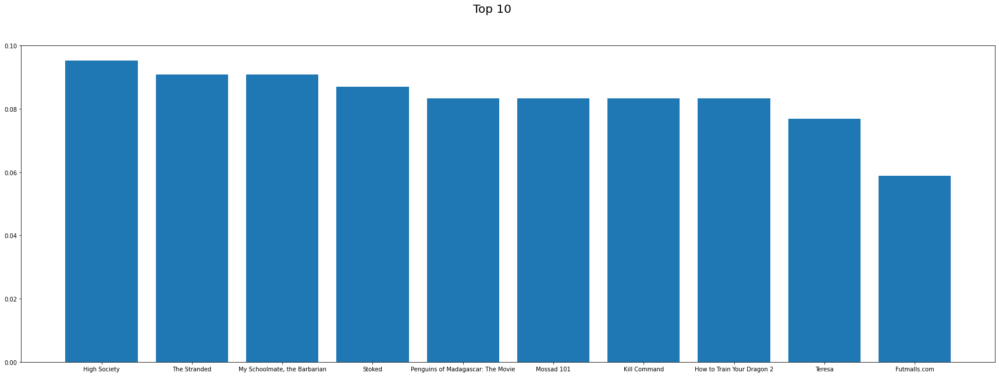

In [ ]:
result = get_similar_movies12('3%',method='boolean')

print(result)
movie,similarity = zip(*result)
wc, wl = zip(*sorted(zip(similarity,movie),reverse=True))
fig = plt.figure(figsize=(30,10))
plt.title = ("Directors")
wc= wc[:10]
wl = wl[:10]
plt.bar(wl,wc)
fig.suptitle("Top 10" ,fontsize=20)

# **Θέμα 2 Ερώτημα 4**

**Περιγραφή κώδικα:**
  Στην περίπτωση του tf-idf:
  Μετρέπουμε σε πίνακα tf-idf τις περιγραφές των εγγραφών καθώς και την περιγραφή που δίνει ο χρήστης ώστε να υπολογιστεί η τιμή για την περιγραφή με βάση όλο το αρχείο και έπειτα παίρνω το δίανυσμα της περιγραφής και το συγκρίνω με τον πίνακα των εγγραφών (μια - μια κάθε εγγραφή του) και τελικά παίρνω τις Ν ταινίες με τις μικρότερες τιμές (αποστάσεις απο την περιγραφή που δόθηκε).

In [ ]:
#dataframes from 1a,2a  are bow_df and jaccard_df
from sklearn.metrics.pairwise import pairwise_distances
from scipy.spatial.distance import cdist
import numpy as np
from scipy.spatial import distance
from sklearn.feature_extraction.text import TfidfVectorizer
import operator

def get_similar_movies2(description,N=10,method='tf-idf'):
  df = titles
  if method == 'boolean':

    df1 = bow_df
    movies1 = df1.values
    data = [str(description)]
    count_vectorizer = CountVectorizer(ngram_range=(1,2),max_df=1.0, min_df=1, max_features=1000,stop_words='english')
    data = count_vectorizer.fit_transform(data)
    names = count_vectorizer.get_feature_names()

    description_names = count_vectorizer.get_feature_names()
    bow_names = bow_vectorizer.get_feature_names()
    description_arr = data.toarray()

    l = []
    i = 0

    for name2 in bow_names:
      flag = 0
      for name1 in description_names:
        if name1 == name2:
          l.append(1)
          flag = 1
      if flag == 0:
        l.append(0)


    l = np.asanyarray(l)
    desc_jac_sim = []

    for i in range(len(movies1)):
      desc_jac_sim.append(1- distance.jaccard(l,movies1[i]))

    l = [(item,idx) for idx,item in enumerate(desc_jac_sim)]
    j = 0
    top = []
    while j < N:
      index, value = max(enumerate(l), key=operator.itemgetter(1))
      del l[index]
      top.append((df.loc[value[1],'title'],value[0]))
      j = j+1
    return top

  elif method=='tf-idf':

    tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 2),max_df=1.0, min_df=1, max_features=10000,stop_words='english')
    unibigrams = tfidf_vectorizer.fit_transform(pd.Series(description).append(df['description'], ignore_index=True))
    unibigrams = unibigrams.toarray()
    mvdescripts = np.delete(unibigrams, 0, 0)
    ar = unibigrams[0].reshape(1,-1)
    movie_comp = 1 - pairwise_distances(ar,mvdescripts,metric='cosine')

    l = [(item,idx) for idx,item in enumerate(movie_comp[0])]
    j = 0
    top = []
    while j < N:
      index, value = max(enumerate(l), key=operator.itemgetter(1))
      del l[index]
      top.append((df.loc[value[1],'title'],value[0]))
      j = j+1
    return top



[('3%', 0.36363636363636365), ('The Stranded', 0.1333333333333333), ('Stoked', 0.125), ('Kill Command', 0.11764705882352944), ('Zig & Sharko', 0.08333333333333337), ("World's Weirdest Homes", 0.08333333333333337), ('The Night Comes for Us', 0.07692307692307687), ('The Incredible Story of the Giant Pear', 0.07692307692307687), ('SDU: Sex Duties Unit', 0.07692307692307687), ('Kantaro: The Sweet Tooth Salaryman', 0.07692307692307687)]
 


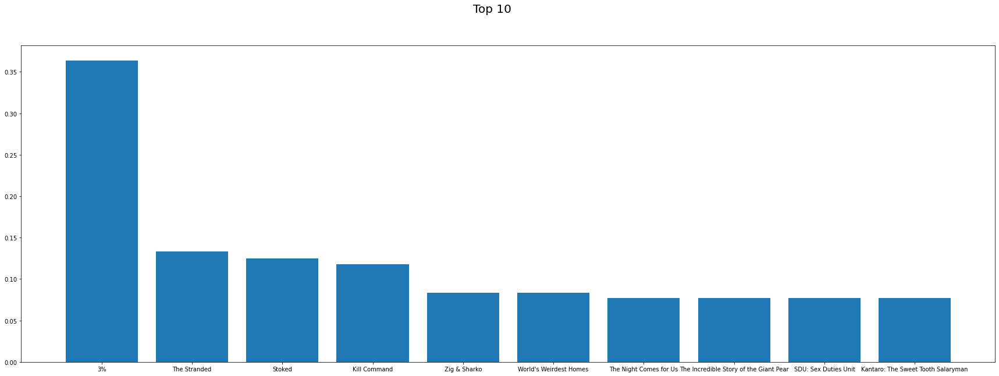

In [ ]:
result = get_similar_movies2(description="elite inhabit an island paradise .",method='boolean')
print(result)
movie,similarity = zip(*result)
wc, wl = zip(*sorted(zip(similarity,movie),reverse=True))
fig = plt.figure(figsize=(30,10))
plt.title = ("Directors")
wc= wc[:10]
wl = wl[:10]
plt.bar(wl,wc)
fig.suptitle("Top 10" ,fontsize=20)
print(" ")


# **Πιθανοί λόγοι αστοχίας:**


  
**1.**Πολλές λέξεις είναι συνώνυμες και οι παραπάνω  τρόποι αναπαράστασης δεν κοιτάνε το νοηματικό περιεχόμενο, αλλά κατά κάποιον τρόπο την αλληλουχία γραμμάτων από την οποία αποτελείται η κάθε λέξη.

**2.**Δε θα εντοπιστούν ομοιότητες από κανέναν από τους δύο παραπάνω τρόπους για συγγενικές λέξεις. (πχ program-programmer).

**3.**Στην περίπτωση των bigrams λέξεις που μπορεί να είναι σε συγκεκριμένη σειρά δεν θα ταυτιστούν με τις ίδιες λέξεις σε διαφορετική σειρά ή με λέξεις ανάμεσά τους παρ' ότι μπορεί να έχουν ίδιο νοηματικό περιεχόμενο.

**4.**Ισώς κάτι λιγότερο σημαντικό είναι το γεγονός ότι πραξεις στα δεδομένα και στρογγυλοποιήσεις σε δεκαδικά ψηφία μας κάνουν να χάνουμε σε ακρίβεια στον υπολογισμό της ομοιόττας.

Σαν γενική παρατήρηση θα μπορούσαμε να πούμε ότι αυτοί οι δύο τρόποι δεν εντοπίζουν νοηματική ομοιότητα.